In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
import numpy as np
import pandas as pd
import os
import os.path as osp
import sys
import time
import cv2
from lxml import etree
from tqdm import tqdm, tnrange, tqdm_notebook
from collections import OrderedDict
import matplotlib.pyplot as plt
import itertools

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.backends.cudnn as cudnn
from torch import Tensor
from torch.optim import lr_scheduler
from torch.autograd import Variable
from torch.utils.data import Dataset, DataLoader
from torch.utils.data.dataset import random_split, Subset

import torchvision
from torchvision import datasets, models

import draw
from draw import show_img, show_img_grid
from boundingbox import bbox_x1y1x2y2_to_xywh, bbox_x1y1x2y2_to_cxcywh, bbox_cxcywh_to_x1y1x2y2, bbox_cxcywh_to_xywh, \
                        bbox_xywh_to_cxcywh, bbox_xywh_to_x1y1x2y2, CoordinateType, FormatType, BoundingBoxConverter

import transforms
from dataset import worker_init_fn, variable_shape_collate_fn

import timeit
import math

In [2]:
cv2.setNumThreads(0)

In [3]:
from transforms import BoundingBoxFormatConvert,ToX1y1x2y2Abs, ToCxcywhRel, ToIaa, iaa_hsv_aug, iaa_random_crop, iaa_letterbox, \
                       IaaAugmentations, ToNp, IaaLetterbox, ToTensor, Compose
from boundingbox import bbox_x1y1x2y2_to_xywh, bbox_x1y1x2y2_to_cxcywh, bbox_cxcywh_to_x1y1x2y2, bbox_cxcywh_to_xywh, \
                        bbox_xywh_to_cxcywh, bbox_xywh_to_x1y1x2y2, CoordinateType, FormatType, BoundingBoxConverter
import imgaug as ia
from imgaug import augmenters as iaa


In [4]:
def getTransforms(dim, bbs_idx=np.arange(0,4),
                  coord_type=CoordinateType.Relative, format_type=FormatType.cxcywh, aug=True):
    if aug:
        transform = Compose([ToX1y1x2y2Abs(coord_type, format_type, bbs_idx),
                             ToIaa(bbs_idx),
                             IaaAugmentations([iaa_hsv_aug(0.1, 1.5, 1.5),
                                               iaa_random_crop(0.3),
                                               iaa.Fliplr(0.5),
                                               iaa.Scale(dim)
                                              ]),
                             ToNp(bbs_idx),
                             ToCxcywhRel(CoordinateType.Absolute, FormatType.x1y1x2y2, bbs_idx),
                             ToTensor()])
    else:
        transform = Compose([ToX1y1x2y2Abs(coord_type, format_type, bbs_idx),
                             ToIaa(bbs_idx),
                             IaaLetterbox(dim),
                             ToNp(bbs_idx),
                             ToCxcywhRel(CoordinateType.Absolute, FormatType.x1y1x2y2, bbs_idx),
                             ToTensor()])
    return transform

In [5]:
def get_trans_fn(bbs_idx, coord_type, format_type, aug):
    def getTransformByDim(dim):
        return getTransforms(dim, bbs_idx, coord_type, format_type, aug)
    return getTransformByDim

In [6]:
def load_coco(path):
    with open(path) as f:
        return [line.rstrip("\n") for line in f.readlines()]
coco_path = './data/coco.names'
classes = load_coco(coco_path)

# RandomCyclicDataset

In [7]:
class RandomCyclicDataset(Dataset):
    def __init__(self, batch_size, shuffle=True, cyclic=True, dim=None, rand_dim_interval=None):
        self.cyclic = cyclic
        
        self.base_indices = self.get_base_indices()
        self.base_length = len(self.base_indices)
        
        self.batch_size = batch_size
        if self.cyclic:
            self.indices_batch = self.base_length // self.batch_size
            self.indices_size = self.indices_batch * self.batch_size
        else:
            self.indices_batch = math.ceil(self.base_length / self.batch_size)
            self.indices_size = len(self.base_indices)
        
        self.shuffle = shuffle
        self.dim = dim
        self.rand_dim_interval = rand_dim_interval
        self.rng_state = None
        self.cyclic = cyclic
        
        self.indices_queue = torch.LongTensor([])
        self.dims_queue = torch.LongTensor([])
        self.rands_queue = torch.LongTensor([])
        self.randomize()
        
    def get_base_indices(self):
        raise NotImplementedError
        

    def _generate_indices_list(self):
        if self.shuffle:
            new_indices = torch.randperm(self.base_length)
        else:
            new_indices = torch.arange(0,self.base_length, dtype=torch.int64)
        
        if self.cyclic:
            if len(self.indices_queue) < self.indices_size:
                self.indices_queue = torch.cat((self.indices_queue, new_indices))
            indices, self.indices_queue = self.indices_queue[:self.indices_size], self.indices_queue[self.indices_size:]
        else:
            indices = new_indices
            self.indices_queue = torch.LongTensor([])
        return indices.tolist()
    
    def _generate_dims_list(self, indices, dim=None, rand_dim_interval=8):
        if dim is not None:
            return [dim for i in range(0, self.indices_size)]
        
        if self.base_length <= rand_dim_interval:
            nDim = 1
        else:
            nDim = math.ceil(self.base_length / rand_dim_interval)
        
        if len(self.dims_queue) < self.indices_size:
            new_dims = torch.randint(10, 20, (nDim,1), dtype=torch.int64) * 32
            new_dims = new_dims.repeat((1,rand_dim_interval)).reshape(1, -1).squeeze()
            self.dims_queue = torch.cat((self.dims_queue, new_dims))
        dims, self.dims_queue = self.dims_queue[:self.indices_size], self.dims_queue[self.indices_size:]
        return [(sz,sz) for sz in dims.tolist()]
    
    def _generate_rands_list(self):
        if len(self.rands_queue) < self.indices_size:
            new_rands = torch.randint(2**32, (self.base_length,), dtype=torch.int64)
            self.rands_queue = torch.cat((self.rands_queue, new_rands))
        rands, self.rands_queue = self.rands_queue[:self.indices_size], self.rands_queue[self.indices_size:]
        return rands.tolist()
    
    def randomize(self, rng_state=None):
        if rng_state is not None:
            torch.set_rng_state(rng_state)
        elif self.rng_state is not None:
            torch.set_rng_state(self.rng_state)

        self.indices = self._generate_indices_list()
        self.dims = self._generate_dims_list(self.indices, dim=self.dim, rand_dim_interval=self.rand_dim_interval)
        self.rands = self._generate_rands_list()
        
        self.rng_state = torch.get_rng_state()
    
    def get_state_dict(self):
        state_dict = { 'dataset_indices' : self.indices,
                       'dataset_dims'  : self.dims,
                       'dataset_rands' : self.rands,
                       'dataset_indices_queue' : self.indices_queue,
                       'dataset_dims_queue'  : self.dims_queue,
                       'dataset_rands_queue' : self.rands_queue,
                       'dataset_rng_state' : self.rng_state,   
                     }
        return state_dict
        
    def load_state_dict(self, state_dict):
        self.indices = state_dict['dataset_indices']
        self.dims = state_dict['dataset_dims']
        self.rands = state_dict['dataset_rands']      
        self.indices_queue = state_dict['dataset_indices_queue']
        self.dims_queue = state_dict['dataset_dims_queue']
        self.rands_queue = state_dict['dataset_rands_queue']
        self.rng_state = state_dict['dataset_rng_state']
    
    # Remove indices based on given batches or idx
    def trimm(self, idx=None, batch_idx=None):
        if batch_idx is not None and idx is None:
            offset_batch_idx = batch_idx % self.indices_batch
            if offset_batch_idx == 0:
                self.indices = []
                self.dims = []
                self.rands = []
                #print("Trim idx:{}, batch_idx:{}".format(idx, offset_batch_idx))
            else:
                offset = self.indices_size - len(self.indices)
                idx = (offset_batch_idx * self.batch_size) - offset 
                
                self.indices = self.indices[idx:]
                self.dims = self.dims[idx:]
                self.rands = self.rands[idx:]
                #print("Trim idx:{}, offset:{}, batch_idx:{}, len(self.indices):{} ".format(idx, offset, offset_batch_idx, len(self.indices)))

    def __len__(self):
        return len(self.indices)
       
    def __getitem__(self, idx):
        sel_idx = self.base_indices[self.indices[idx]]
        return str(sel_idx) + '-' + str(self.dims[idx][0]) + '-' + str(self.rands[idx])

# DataHelper - manages dataset and dataloader

In [8]:
class DataHelper():
    def __init__(self, dataset, dataloader, current_batch=0, current_epoch=0,
                 max_net_batches=None, max_batches=None, net_subdivisions=1):
        self.dataset = dataset
        self.dataloader = dataloader
        
        self.batch_size = self.dataset.batch_size
        self.current_batch = current_batch
        self.current_epoch = current_epoch
        self.net_subdivisions = net_subdivisions
        
        if max_net_batches is not None:
            self.max_net_batches = max_net_batches
            self.max_batches = self.max_net_batches * self.net_subdivisions
        elif max_batches is not None:
            self.max_batches = max_batches
        else:
            self.max_batches = self.dataset.indices_batch
        
        self.iterator = None

    def __iter__(self):
        if self.iterator is None:
            self.iterator = iter(self.gen())
        return self.iterator

    def gen(self):
        while self.current_batch < self.max_batches:
            for i in self.dataloader:
                yield(i)
                self.current_batch += 1
                if self.current_batch >= self.max_batches:
                    break
            self.dataset.randomize()

    def get_state_dict(self):
        state_dict = { 'current_batch' : self.current_batch,
                       'dataset': self.dataset.get_state_dict(),
                     }
        return state_dict

    def load_state_dict(self, state_dict):
        self.iterator = None
        self.current_batch = state_dict['current_batch'] + 1
        self.dataset.load_state_dict(state_dict['dataset'])
        # Remove processed indices from the dataset
        self.dataset.trimm(batch_idx=self.current_batch)

    def reset(self):
        self.iterator = None
        self.current_batch = 0
        return self

    # Helper functions to get batch information
    def get_batch(self):
        return self.current_batch

    def get_net_batch(self):
        return self.current_batch // self.net_subdivisions
    
    def get_epoch(self):
        return self.current_batch // self.get_epoch_num_batches()

    def get_epoch_batch(self):
        return self.current_batch % self.get_epoch_num_batches()
    
    def get_epoch_num_batches(self):
        return self.dataset.indices_batch

    def isStartOfEpoch(self):
        return ((self.current_batch) % self.get_epoch_num_batches()) == 0

    def isEndOfEpoch(self):
        return ((self.current_batch + 1) % self.get_epoch_num_batches()) == 0

# IndiceDataset

In [9]:
class IndiceDataset(RandomCyclicDataset):
    def __init__(self, indices, batch_size, shuffle=True, cyclic=True, dim=None, rand_dim_interval=None):
        self.indices = indices
        super().__init__(batch_size, shuffle, cyclic, dim, rand_dim_interval)
    
    # Implement get_base_indices() to use this class
    def get_base_indices(self):
        return self.indices

## Non-shuffled indices

In [10]:
dim = (416, 416)
bs = 4
random_dim_interval = bs * 2

torch.manual_seed(0)
indice_ds = IndiceDataset(np.arange(0, 19), bs, shuffle=False, cyclic=True, dim=None, rand_dim_interval=random_dim_interval)
indice_dl = DataLoader(indice_ds, batch_size=bs, shuffle=False, num_workers=4, worker_init_fn=worker_init_fn, collate_fn=variable_shape_collate_fn)
data = DataHelper(indice_ds, indice_dl, current_batch=0, max_batches=50)

In [11]:
# Obeserve "Batch 4" and "Batch 5". Notice when the dataset size is not aligned with the batch size,
# the next batch would still be able over pick up the left over samples on the next batch. 
epoch = 0

for i in data:
    output = "Epoch:{}|Batch:{} {}".format(data.get_epoch(), data.get_batch(), str(i))
    print(output)
    if data.isEndOfEpoch():
        print("Epoch end")


Epoch:0|Batch:0 ['0-448-2588848963', '1-448-2340255427', '2-448-1819583497', '3-448-2774094101']
Epoch:0|Batch:1 ['4-448-1879422756', '5-448-3830135878', '6-448-4138900056', '7-448-1646868794']
Epoch:0|Batch:2 ['8-608-3400433126', '9-608-2271586391', '10-608-2439732824', '11-608-3975407269']
Epoch:0|Batch:3 ['12-608-305097549', '13-608-374217481', '14-608-86837363', '15-608-3576074995']
Epoch end
Epoch:1|Batch:4 ['16-416-3342157822', '17-416-3736673711', '18-416-4203133778', '0-416-2235433757']
Epoch:1|Batch:5 ['1-416-2915765395', '2-416-3095093671', '3-416-2499755969', '4-416-2308000441']
Epoch:1|Batch:6 ['5-416-3258229280', '6-416-454869706', '7-416-2034098327', '8-416-800291326']
Epoch:1|Batch:7 ['9-416-3165039474', '10-416-930076700', '11-416-580757632', '12-416-1392175012']
Epoch end
Epoch:2|Batch:8 ['13-512-642848645', '14-512-954863080', '15-512-1659957521', '16-512-3876630916']
Epoch:2|Batch:9 ['17-512-1932520490', '18-512-2633087519', '0-512-3875557633', '1-512-426405863']
Epo

## Shuffled  Indices

In [12]:
bs = 4
random_dim_interval = bs * 2

torch.manual_seed(0)
indice_ds = IndiceDataset(np.arange(0, 19), bs, shuffle=True, cyclic=True, rand_dim_interval=random_dim_interval)
indice_dl = DataLoader(indice_ds, batch_size=bs, shuffle=False, num_workers=4, worker_init_fn=worker_init_fn, collate_fn=variable_shape_collate_fn)
data = DataHelper(indice_ds, indice_dl, current_batch=0, max_batches=20)

In [13]:
for i in data:
    print("Epoch:{}|Batch:{} {}".format(data.get_epoch(), data.get_batch(), str(i)))

Epoch:0|Batch:0 ['15-448-2271586391', '10-448-2439732824', '14-448-3975407269', '3-448-305097549']
Epoch:0|Batch:1 ['17-448-374217481', '2-448-86837363', '9-448-3576074995', '5-448-3342157822']
Epoch:0|Batch:2 ['7-416-3736673711', '12-416-4203133778', '18-416-3432359896', '13-416-1982038771']
Epoch:0|Batch:3 ['11-416-3352347283', '16-416-507984782', '4-416-2748439840', '0-416-615697673']
Epoch:1|Batch:4 ['6-512-4057322111', '8-512-2241321503', '1-512-1780959476', '13-512-2633087519']
Epoch:1|Batch:5 ['14-512-3875557633', '8-512-426405863', '1-512-4165298233', '0-512-2805215078']
Epoch:1|Batch:6 ['6-512-734051083', '4-512-1538251858', '17-512-3224172416', '12-512-2610612835']
Epoch:1|Batch:7 ['7-512-1396067212', '3-512-165035946', '16-512-2724186315', '9-512-4118655750']
Epoch:2|Batch:8 ['5-352-2803713071', '10-352-2727557108', '15-352-4274779084', '18-352-2499028148']
Epoch:2|Batch:9 ['11-352-1779699534', '2-352-2038810260', '13-352-2893346084', '7-352-4174471984']
Epoch:2|Batch:10 ['0

## Resumable between batches

In [14]:
bs = 4
random_dim_interval = bs * 2

torch.manual_seed(0)
indice_ds = IndiceDataset(np.arange(0, 19), bs, shuffle=True, cyclic=True, rand_dim_interval=random_dim_interval)
indice_dl = DataLoader(indice_ds, batch_size=bs, shuffle=False, num_workers=4, worker_init_fn=worker_init_fn, collate_fn=variable_shape_collate_fn)
data = DataHelper(indice_ds, indice_dl, current_batch=0, max_batches=20)

In [15]:
cut_off_batch = 6
state_dict_list = []
for i in data:
    print("Epoch:{}|Batch:{} {}".format(data.get_epoch(), data.get_batch(), str(i)))
    state_dict_list.append(data.get_state_dict())
    
    if data.current_batch == cut_off_batch:
        break

Epoch:0|Batch:0 ['15-448-2271586391', '10-448-2439732824', '14-448-3975407269', '3-448-305097549']
Epoch:0|Batch:1 ['17-448-374217481', '2-448-86837363', '9-448-3576074995', '5-448-3342157822']
Epoch:0|Batch:2 ['7-416-3736673711', '12-416-4203133778', '18-416-3432359896', '13-416-1982038771']
Epoch:0|Batch:3 ['11-416-3352347283', '16-416-507984782', '4-416-2748439840', '0-416-615697673']
Epoch:1|Batch:4 ['6-512-4057322111', '8-512-2241321503', '1-512-1780959476', '13-512-2633087519']
Epoch:1|Batch:5 ['14-512-3875557633', '8-512-426405863', '1-512-4165298233', '0-512-2805215078']
Epoch:1|Batch:6 ['6-512-734051083', '4-512-1538251858', '17-512-3224172416', '12-512-2610612835']


In [16]:
bs = 4
random_dim_interval = bs * 2

torch.manual_seed(0)
indice_ds = IndiceDataset(np.arange(0, 19), bs, shuffle=True, cyclic=True, rand_dim_interval=random_dim_interval)
indice_dl = DataLoader(indice_ds, batch_size=bs, shuffle=False, num_workers=4, worker_init_fn=worker_init_fn, collate_fn=variable_shape_collate_fn)
data = DataHelper(indice_ds, indice_dl, current_batch=0, max_batches=20)

In [17]:
data.load_state_dict(state_dict_list[-1])
# Notice idx, dim, random values are exactly the same as the original shuffled dataset above
for i in data:
    print("Epoch:{}|Batch:{} {}".format(data.get_epoch(), data.get_batch(), str(i)))

Epoch:1|Batch:7 ['7-512-1396067212', '3-512-165035946', '16-512-2724186315', '9-512-4118655750']
Epoch:2|Batch:8 ['5-352-2803713071', '10-352-2727557108', '15-352-4274779084', '18-352-2499028148']
Epoch:2|Batch:9 ['11-352-1779699534', '2-352-2038810260', '13-352-2893346084', '7-352-4174471984']
Epoch:2|Batch:10 ['0-320-3771812227', '18-320-2188820010', '17-320-239292784', '3-320-1937714069']
Epoch:2|Batch:11 ['15-320-85846399', '6-320-1897133962', '5-320-4207292971', '8-320-1543802239']
Epoch:3|Batch:12 ['4-512-2065422011', '14-512-2957777273', '12-512-3781615166', '11-512-3943791326']
Epoch:3|Batch:13 ['16-512-931243971', '10-512-2427467694', '9-512-3715587220', '2-512-2186005042']
Epoch:3|Batch:14 ['1-480-3937295118', '17-480-3560270312', '13-480-20166942', '3-480-2911199869']
Epoch:3|Batch:15 ['7-480-1159675395', '0-480-3157634274', '9-480-4132568333', '5-480-1068386600']
Epoch:4|Batch:16 ['2-384-2474576915', '4-384-2542800712', '11-384-2457803202', '16-384-958128308']
Epoch:4|Batch

# COCO

In [18]:
def load_coco(path):
    with open(path) as f:
        return [line.rstrip("\n") for line in f.readlines()]
coco_path = './data/coco.names'
classes = load_coco(coco_path)

In [19]:
class COCODataset(RandomCyclicDataset):
    
    def __init__(self, targ_txt_path, batch_size, shuffle=True, cyclic=True, dim=None, rand_dim_interval=None,
                 trans_fn=None, subset_idx=None):
        self.trans_fn = trans_fn
        self.subset_idx = subset_idx
        self.img_list, self.label_list = self._get_images_and_labels(targ_txt_path)
        super().__init__(batch_size, shuffle, cyclic, dim, rand_dim_interval)
        
    def get_base_indices(self):
        length = len(self.img_list)
        base_indices = torch.arange(0, length, dtype=torch.int64)
        if self.subset_idx is not None:
            base_indices = base_indices[self.subset_idx]
        return base_indices.tolist()
    
    def _get_images_and_labels(self, targ_txt_path):
        with open(targ_txt_path, 'r') as f:
            img_list = [lines.strip() for lines in f.readlines()]
        label_list = [img_path.replace('jpg', 'txt').replace('images', 'labels') for img_path in img_list]
        return img_list, label_list
    
    def __getitem__(self, idx):
        label = None
        
        seed = self.rands[idx]
        ia.seed(seed)
        np.random.seed(seed)
        
        dim = self.dims[idx]
        transform = self.trans_fn(dim)
        
        sel_idx = self.base_indices[self.indices[idx]]
        img_path = self.img_list[sel_idx]
        if osp.exists(img_path):
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        else:
            raise FileNotFoundError(errno.ENOENT, os.strerror(errno.ENOENT), img_path)
        
        label_path = self.label_list[sel_idx]
        if osp.exists(label_path):
            label = np.loadtxt(label_path).reshape(-1,5)
        
        sample = { 'img': img, 'org_img': img.copy(), 'label': label, 'transform': None, 'img_path': img_path }
        sample = transform(sample)
        return sample

## Testing functions - show image / print image size / save and load

In [20]:
def save_data_state(data, checkpoint_path):
    checkpoint = {'data' : data.get_state_dict()}
    torch.save(checkpoint, checkpoint_path)
    
def load_data_state(data, checkpoint_path):
    checkpoint = torch.load(checkpoint_path,  map_location=lambda storage, loc: storage)
    data.load_state_dict(checkpoint['data'])
    return data  

def run_data_batches(data, classes_names, isShowImg=True, save=True,
                     load_checkpoint_path=None, save_checkpoint_path=None,
                     debug_batch_cut_off=None):
    processed_batch = 0
    state_dict_list = []
    img_list = []
    labels_list = torch.FloatTensor()
    
    if load_checkpoint_path is not None:
        load_data_state(data, load_checkpoint_path)
        
    for sample in data:
        dim = (sample['img'].shape[3], sample['img'].shape[2])
        img_list += [img for img in sample['img'].permute(0,2,3,1).numpy()]         
        
        labels_list = torch.cat((labels_list, sample['label']), 0)
        labels_list = labels_list.numpy()
        labels_list = BoundingBoxConverter.convert(labels_list, CoordinateType.Relative, FormatType.cxcywh,
                                                          CoordinateType.Absolute, FormatType.xywh,
                                                          np.array([1,2,3,4]), dim)
        if isShowImg:
            show_img_grid(img_list, cols=3, classes=classes_names, labels_list=labels_list)

        img_list = []
        labels_list = torch.FloatTensor()

        print('Batch:{} {}'.format(data.current_batch, str(sample['img'].shape)))
        if save_checkpoint_path is not None:
            save_data_state(data, save_checkpoint_path)

        processed_batch += 1
        
        if debug_batch_cut_off is not None and processed_batch >= debug_batch_cut_off:
            break

In [21]:
def getCOCOData(seed, train_target_txt, bs, max_batches=0,
                subset_idx=None,
                shuffle=False, cyclic=True, dim=None, rand_dim_interval=None):
    torch.manual_seed(seed)
    trans_fn = get_trans_fn(np.arange(1,5), CoordinateType.Relative, FormatType.cxcywh, True)
    coco_ds = COCODataset(train_target_txt, bs, subset_idx=subset_idx, trans_fn=trans_fn, shuffle=shuffle, cyclic=cyclic, dim=dim, rand_dim_interval=rand_dim_interval)
    coco_dl = DataLoader(coco_ds, batch_size=bs, shuffle=False, num_workers=4, worker_init_fn=worker_init_fn, collate_fn=variable_shape_collate_fn)
    coco_data = DataHelper(coco_ds, coco_dl, current_batch=0, max_batches=max_batches)
    return coco_data

In [22]:
bs = 3
sz = 416
dim = (sz, sz)
shuffle = True
train_target_txt = "./data/coco/trainvalno5k.txt"

In [23]:
seed = 0
# Change dimension every 10 batches
random_dim_interval = bs * 2
subset_idx = np.arange(0, 9)

coco_data = getCOCOData(seed, train_target_txt, bs, max_batches=10,
                        subset_idx=subset_idx,
                        shuffle=True, cyclic=True, dim=None, rand_dim_interval=random_dim_interval)

## Show all batches

Batch:0 torch.Size([3, 3, 544, 544])
Batch:1 torch.Size([3, 3, 544, 544])
Batch:2 torch.Size([3, 3, 416, 416])
Batch:3 torch.Size([3, 3, 416, 416])
Batch:4 torch.Size([3, 3, 384, 384])


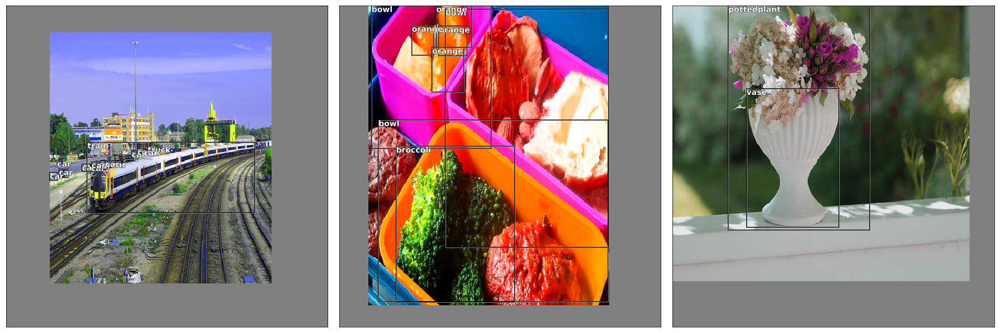

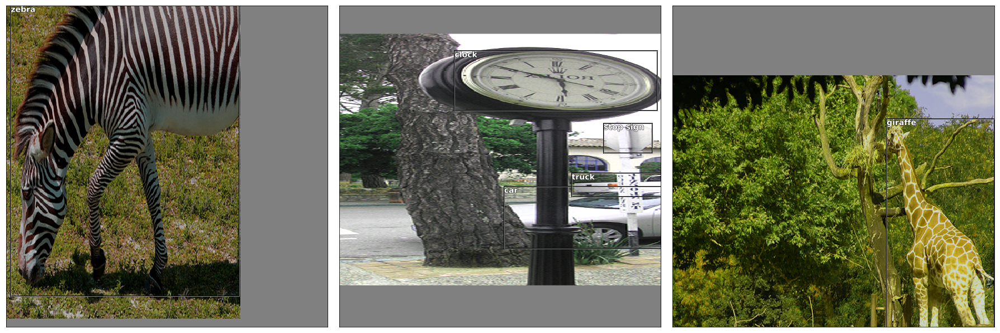

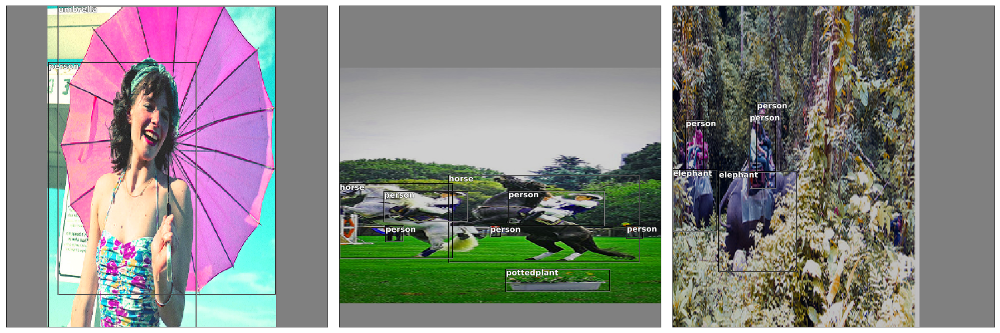

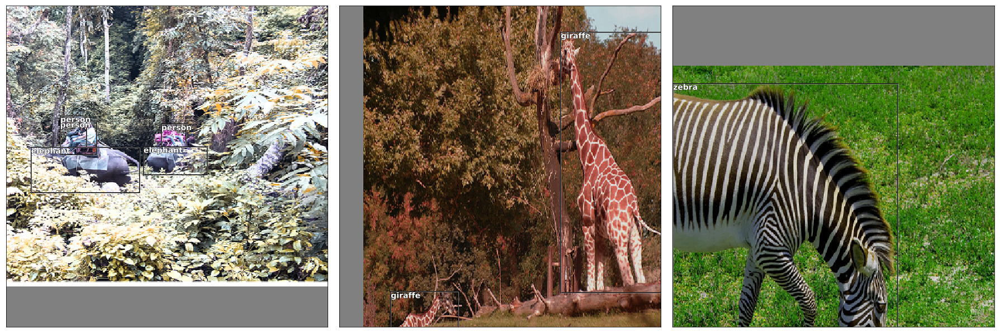

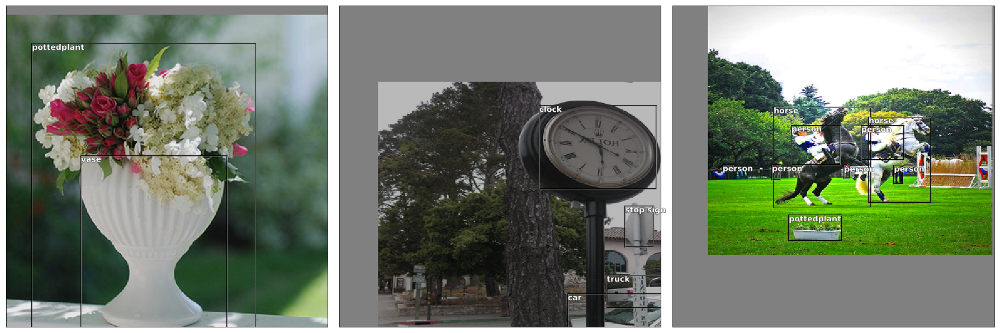

In [24]:
coco_data = getCOCOData(seed, train_target_txt, bs, max_batches=5,
                        subset_idx=subset_idx,
                        shuffle=True, cyclic=True, dim=None, rand_dim_interval=random_dim_interval)
run_data_batches(coco_data, classes, isShowImg=True, save=True,
                 load_checkpoint_path=None, save_checkpoint_path=None,
                 debug_batch_cut_off=None)

## Load up to the 2nd batch

Batch:0 torch.Size([3, 3, 544, 544])
Batch:1 torch.Size([3, 3, 544, 544])


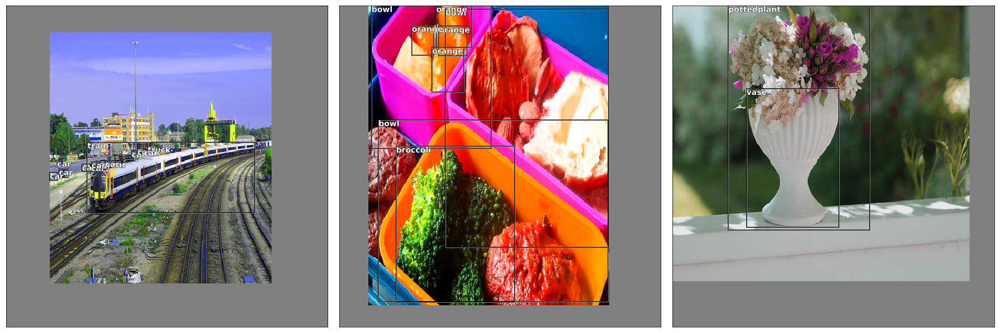

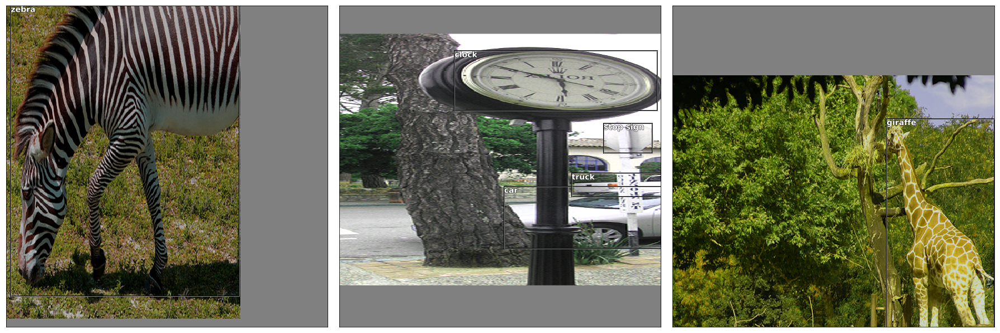

In [25]:
coco_data = getCOCOData(seed, train_target_txt, bs, max_batches=2,
                        subset_idx=subset_idx,
                        shuffle=True, cyclic=True, dim=None, rand_dim_interval=random_dim_interval)
run_data_batches(coco_data, classes, isShowImg=True, save=True,
                 load_checkpoint_path=None, save_checkpoint_path='test_coco_data.pt',
                 debug_batch_cut_off=7)

## Resuming from the 3rd batch

Batch:2 torch.Size([3, 3, 416, 416])
Batch:3 torch.Size([3, 3, 416, 416])
Batch:4 torch.Size([3, 3, 384, 384])


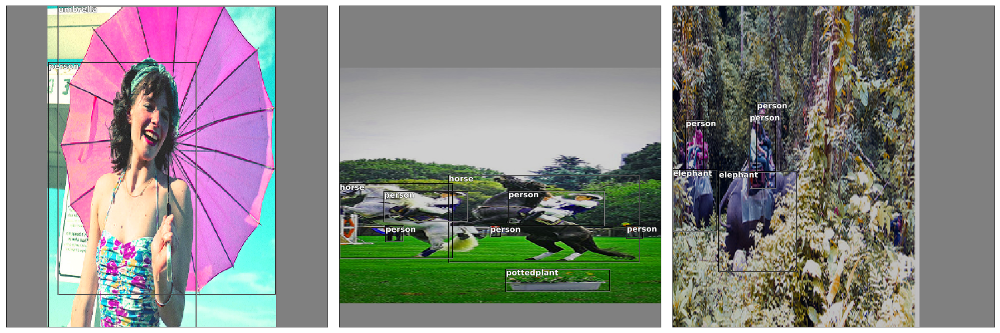

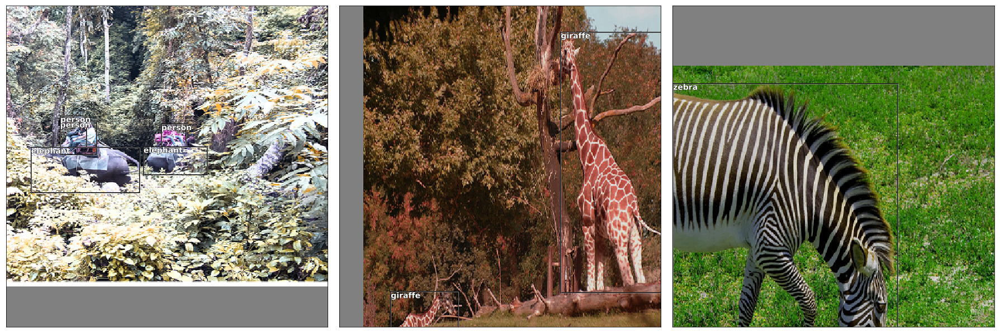

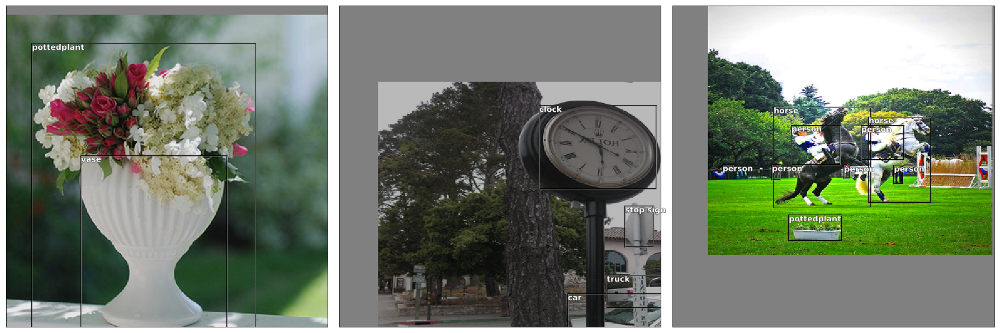

In [26]:
coco_data = getCOCOData(seed, train_target_txt, bs, max_batches=5,
                        subset_idx=subset_idx,
                        shuffle=True, cyclic=True, dim=None, rand_dim_interval=random_dim_interval)
run_data_batches(coco_data, classes, isShowImg=True, save=True,
                 load_checkpoint_path='test_coco_data.pt', save_checkpoint_path=None,
                 debug_batch_cut_off=None)

# CVAT

In [27]:
from dataset import get_xml_labels

class CVATDataset(RandomCyclicDataset):
    def __init__(self, img_dir, label_xml_path, batch_size, subset_idx=None, trans_fn=None,
                 shuffle=True, cyclic=True, dim=None, rand_dim_interval=None):
        self.img_dir = img_dir
        self.label_xml_path = label_xml_path
        
        self.trans_fn = trans_fn
        self.subset_idx = subset_idx
        self.trans_fn = trans_fn

        self.class2id = { 'x_wing': 0, 'tie': 1}
        self.id2class = {v:k for k,v in self.class2id.items()}
        self.xml_dict = list(get_xml_labels(self.label_xml_path).items())
        
        super().__init__(batch_size, shuffle, cyclic, dim, rand_dim_interval)
        
    def get_base_indices(self):
        length = len(self.xml_dict)
        base_indices = torch.arange(0, length, dtype=torch.int64)
        if self.subset_idx is not None:
            base_indices = base_indices[self.subset_idx]
        return base_indices.tolist()
    
    def __getitem__(self, idx):
        label = None

        seed = self.rands[idx]
        ia.seed(seed)
        np.random.seed(seed)
        
        dim = self.dims[idx]
        transform = self.trans_fn(dim)
        
        sel_idx = self.base_indices[self.indices[idx]]
        
        img_path, label = self.xml_dict[sel_idx]
        
        img_path = osp.join(self.img_dir, img_path)
        if osp.exists(img_path):
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        else:
            raise FileNotFoundError(errno.ENOENT, os.strerror(errno.ENOENT), img_path)
        img_dim = img.shape[1], img.shape[0]
        
        bbs_idx = np.arange(1,5)
        label = np.array( [ [self.class2id[l['cls']],
                                             l['x1'],
                                             l['y1'],
                                             l['x2'],
                                             l['y2'] ] for l in label] ).astype(np.float)
        label = BoundingBoxConverter.convert(label,
                                             CoordinateType.Absolute, FormatType.x1y1x2y2,
                                             CoordinateType.Relative, FormatType.cxcywh,
                                             bbs_idx, img_dim)
         
        sample = { 'img': img, 'org_img': img.copy(), 'label': label, 'img_path': img_path }
        sample = transform(sample)
        return sample

In [28]:
sz = 416
bs = 8
dim = (sz, sz)
cvat_img_dir = './custom_data/x_wing'
label_xml_path = './custom_data/7_x_wing.xml'
output_dir = './output'
cvat_classes_path = './x_wing.names'
cvat_classes_names = ['x_wing', 'tie']

In [29]:
def getCVATData(seed, cvat_img_dir, label_xml_path, bs, max_batches=0, aug=True,
                subset_idx=None,
                shuffle=True, cyclic=True, dim=None, rand_dim_interval=None):
    torch.manual_seed(seed)
    cvat_trans_fn = get_trans_fn(np.arange(1,5), CoordinateType.Relative, FormatType.cxcywh, aug)
    cvat_ds = CVATDataset(cvat_img_dir, label_xml_path, bs, subset_idx=subset_idx, trans_fn=cvat_trans_fn,
                          shuffle=shuffle, cyclic=cyclic, dim=dim, rand_dim_interval=rand_dim_interval)
    cvat_dl = DataLoader(cvat_ds, batch_size=bs, shuffle=False, num_workers=4, worker_init_fn=worker_init_fn, collate_fn=variable_shape_collate_fn)
    cvat_data = DataHelper(cvat_ds, cvat_dl, current_batch=0, max_batches=max_batches)
    return cvat_data

In [30]:
def save_data_state(data, checkpoint_path):
    checkpoint = {'data' : data.get_state_dict()}
    torch.save(checkpoint, checkpoint_path)
    
def load_data_state(data, checkpoint_path):
    checkpoint = torch.load(checkpoint_path,  map_location=lambda storage, loc: storage)
    data.load_state_dict(checkpoint['data'])
    return data  

def run_data_batches(data, classes_names, isShowImg=True, save=True,
                     load_checkpoint_path=None, save_checkpoint_path=None,
                     debug_batch_cut_off=None, force_data_max_batches=None):
    processed_batch = 0
    state_dict_list = []
    img_list = []
    labels_list = torch.FloatTensor()
    
    if load_checkpoint_path is not None:
        load_data_state(data, load_checkpoint_path)
        
    if force_data_max_batches is not None:
        data.max_batches = force_data_max_batches
        
    for sample in data:
        dim = (sample['img'].shape[3], sample['img'].shape[2])
        img_list += [img for img in sample['img'].permute(0,2,3,1).numpy()]         
        
        labels_list = torch.cat((labels_list, sample['label']), 0)
        labels_list = labels_list.numpy()
        labels_list = BoundingBoxConverter.convert(labels_list, CoordinateType.Relative, FormatType.cxcywh,
                                                          CoordinateType.Absolute, FormatType.xywh,
                                                          np.array([1,2,3,4]), dim)
        if isShowImg:
            show_img_grid(img_list, cols=3, classes=classes_names, labels_list=labels_list)

        img_list = []
        labels_list = torch.FloatTensor()

        print('Batch:{} {}'.format(data.current_batch, str(sample['img'].shape)))
        #print(sample['img_path'])
        if save_checkpoint_path is not None:
            save_data_state(data, save_checkpoint_path)

        processed_batch += 1
        
        if debug_batch_cut_off is not None and processed_batch >= debug_batch_cut_off:
            break

In [31]:
dim = (416, 416)
bs = 3

seed = 0
random_dim_interval = bs * 2

nSamples = 9
start = 150
end = start + nSamples
subset_idx = np.arange(start, end)

## Load 3 batches and stop

Batch:0 torch.Size([3, 3, 544, 544])
Batch:1 torch.Size([3, 3, 544, 544])
Batch:2 torch.Size([3, 3, 416, 416])


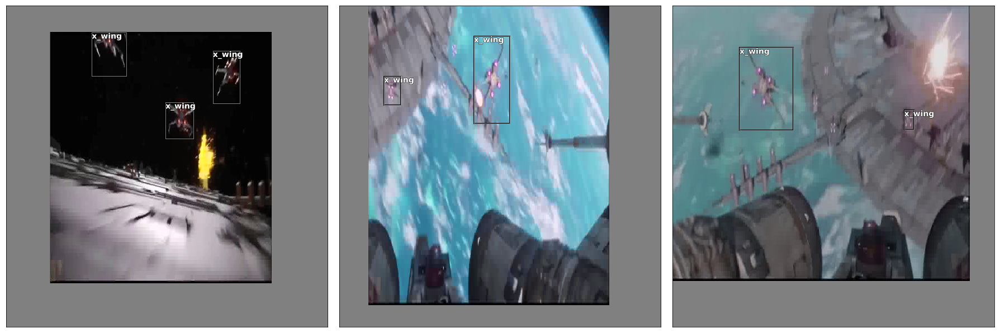

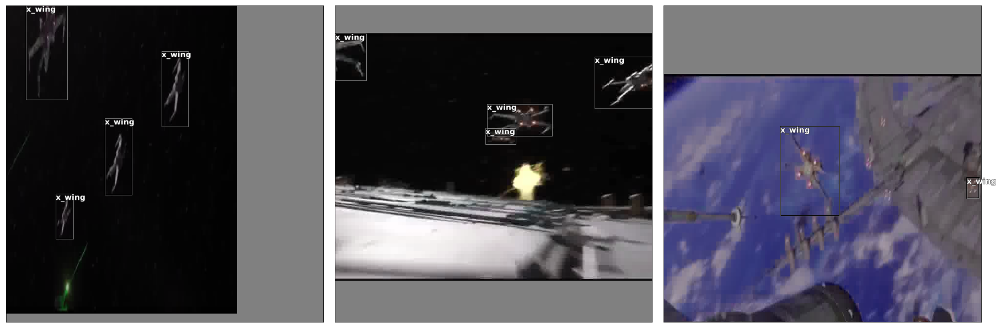

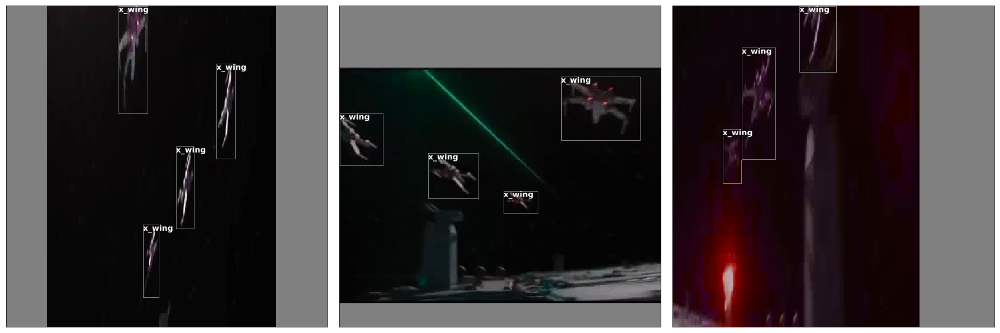

In [32]:
data = getCVATData(seed, cvat_img_dir, label_xml_path, bs, max_batches=3,
                   subset_idx=subset_idx,
                   shuffle=True, cyclic=True, dim=None, rand_dim_interval=random_dim_interval)
run_data_batches(data, cvat_classes_names, isShowImg=True, save=True,
                 load_checkpoint_path=None, save_checkpoint_path='test_cvat_data.pt',
                 debug_batch_cut_off=None)

## Resume

Batch:3 torch.Size([3, 3, 416, 416])
Batch:4 torch.Size([3, 3, 384, 384])


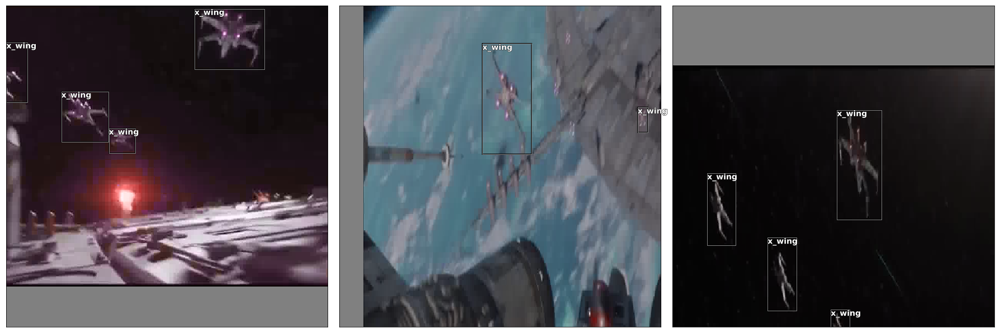

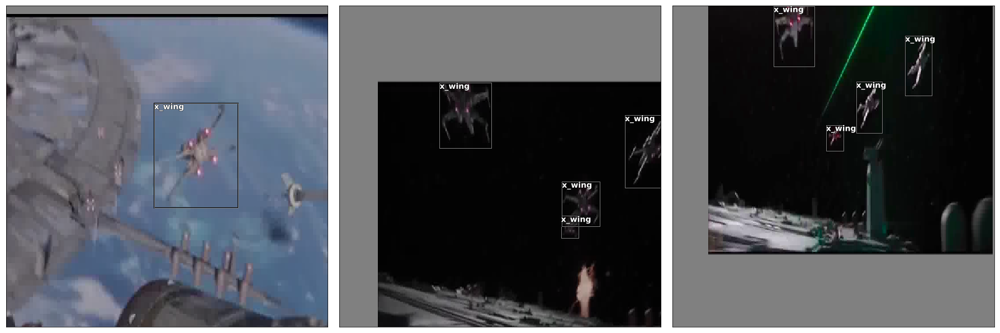

In [33]:
data = getCVATData(seed, cvat_img_dir, label_xml_path, bs, max_batches=3,
                   subset_idx=subset_idx,
                   shuffle=True, cyclic=True, dim=None, rand_dim_interval=random_dim_interval)
run_data_batches(data, cvat_classes_names, isShowImg=True, save=True,
                 load_checkpoint_path='test_cvat_data.pt', save_checkpoint_path=None,
                 debug_batch_cut_off=None, force_data_max_batches=5)

## Load all 5 batches at once

Batch:0 torch.Size([3, 3, 544, 544])
Batch:1 torch.Size([3, 3, 544, 544])
Batch:2 torch.Size([3, 3, 416, 416])
Batch:3 torch.Size([3, 3, 416, 416])
Batch:4 torch.Size([3, 3, 384, 384])


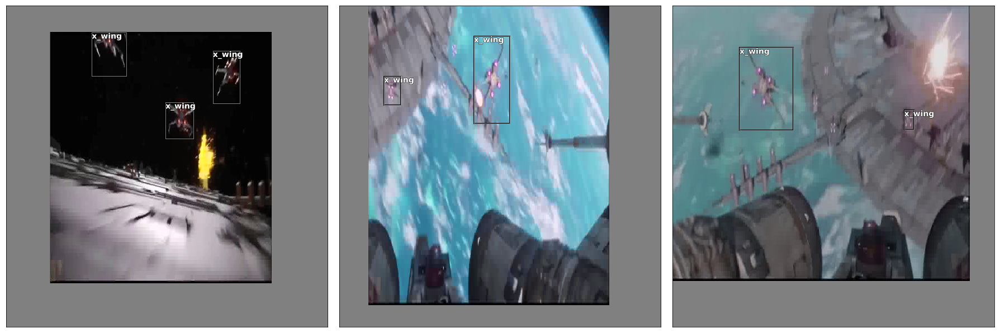

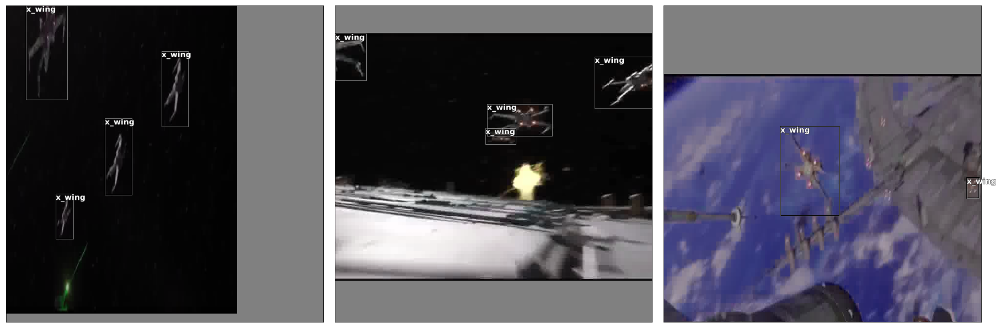

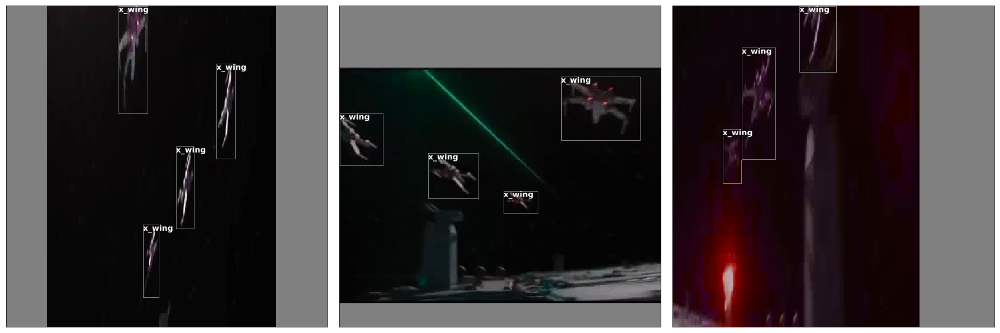

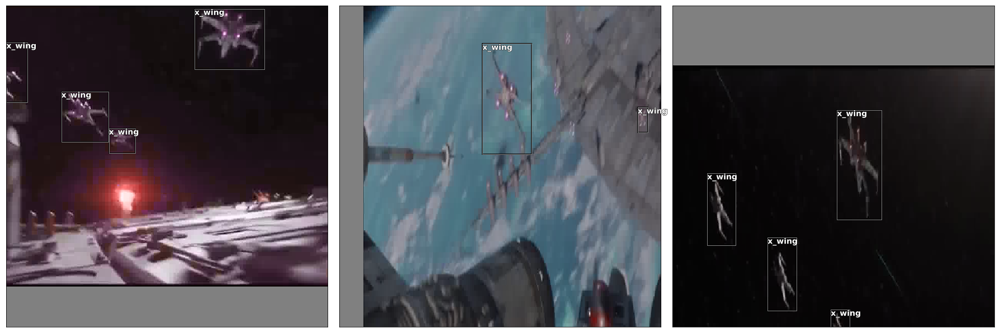

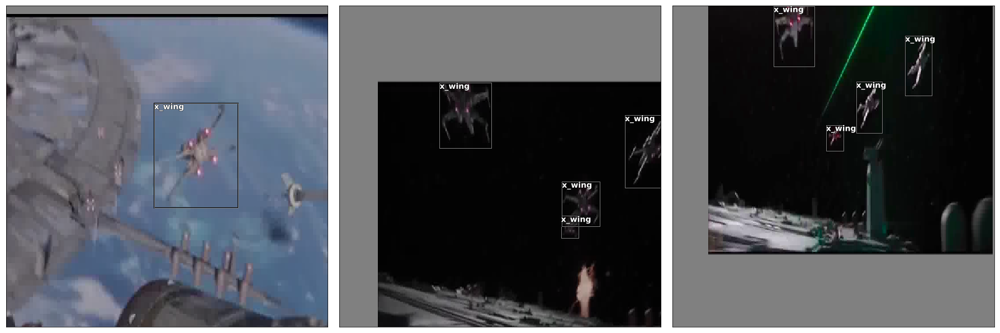

In [34]:
data = getCVATData(seed, cvat_img_dir, label_xml_path, bs, max_batches=5,
                   subset_idx=subset_idx,
                   shuffle=True, cyclic=True, dim=None, rand_dim_interval=random_dim_interval)
run_data_batches(data, cvat_classes_names, isShowImg=True, save=True,
                 load_checkpoint_path=None, save_checkpoint_path=None,
                 debug_batch_cut_off=None, force_data_max_batches=None)